<a href="https://colab.research.google.com/github/Rachhh53/WebNetworkScience/blob/main/Assignment_5_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## MSDS 452
## Assignment 5

##Colab Set Up

### Pygraphviz

In [1]:
!sudo apt-get install -q graphviz libgraphviz-dev pkg-config
!sudo apt-get install -q python-pip python-virtualenv
!pip install -q pygraphviz

Reading package lists...
Building dependency tree...
Reading state information...
pkg-config is already the newest version (0.29.1-0ubuntu2).
graphviz is already the newest version (2.40.1-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk libxdot4
0 upgraded, 8 newly installed, 0 to remove and 29 not upgraded.
Need to get 2,120 kB of archives.
After this operation, 7,128 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libgtk2.0-common all 2.24.32-1ubuntu1 [125 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main 

###Visualizations with Bokeh & Holoviews

A working version of a notebook demonstrating holoviews can be found here:
https://colab.research.google.com/drive/1CrfBZsTzYjf3NpwQJ1VwjQ_Eq1cjMBpe

In [2]:
#https://pypi.org/project/bokeh/
import bokeh
bokeh.sampledata.download()

import bokeh.io
bokeh.io.output_notebook()

Creating /root/.bokeh directory
Creating /root/.bokeh/data directory
Using data directory: /root/.bokeh/data
Downloading: CGM.csv (1589982 bytes)
   1589982 [100.00%]
Downloading: US_Counties.zip (3171836 bytes)
   3171836 [100.00%]
Unpacking: US_Counties.csv
Downloading: us_cities.json (713565 bytes)
    713565 [100.00%]
Downloading: unemployment09.csv (253301 bytes)
    253301 [100.00%]
Downloading: AAPL.csv (166698 bytes)
    166698 [100.00%]
Downloading: FB.csv (9706 bytes)
      9706 [100.00%]
Downloading: GOOG.csv (113894 bytes)
    113894 [100.00%]
Downloading: IBM.csv (165625 bytes)
    165625 [100.00%]
Downloading: MSFT.csv (161614 bytes)
    161614 [100.00%]
Downloading: WPP2012_SA_DB03_POPULATION_QUINQUENNIAL.zip (4816256 bytes)
   4816256 [100.00%]
Unpacking: WPP2012_SA_DB03_POPULATION_QUINQUENNIAL.csv
Downloading: gapminder_fertility.csv (64346 bytes)
     64346 [100.00%]
Downloading: gapminder_population.csv (94509 bytes)
     94509 [100.00%]
Downloading: gapminder_life_e

In [3]:
!pip install holoviews 
import holoviews as hv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
#https://pypi.org/project/hvplot/
!pip install hvplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 5.1 MB/s 


In [5]:
def _render(self, **kw):
  hv.extension('bokeh')
  return hv.Store.render(self)
hv.core.Dimensioned._repr_mimebundle_ = _render

In [6]:
!pip install -q datashader

     |████████████████████████████████| 18.2 MB 5.0 MB/s 
     |████████████████████████████████| 76 kB 5.4 MB/s 


In [7]:
!pip install chart_studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 64 kB 1.9 MB/s 
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=3e3c914fdc28806c2411079a4de61a40dc2b4b4f58210126d7e527661ecea290
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


###Mount Drive and Navigate to folder

In [8]:
# #connect gdrive into the google colab
# from google.colab import drive
# drive.mount('/content/gdrive')

In [9]:
# #Change directory - navigate to your target directory in google drive
# %cd 

In [10]:
# #list files in directory, confirm your target data sources are in the location  
# %ls

## Bibliographic Networks

**Go to the Scopus Document Search webpage (under the Northwestern University VPN):** 

**https://www-scopus-com.turing.library.northwestern.edu/search/form.uri?display=basic**

**Select *Documents* (the default selection) and enter a search term (here I have used *machine learning*) in *Article Title, Abstract, Keywords* (to be selected at the right side of the *Search*).**

**Click *Published* and select *Added to Scopus in the last 30 days.***

**Click *Search* and in the obtained page click *All* and in "CSV export* select ONLY the following five attributes: *Author(s), Document title, Year, Source title, Include references.* Next, click "Export" to get the csv file of your results.**

<span style="color:red">**The resulting csv file should have at least 1,000 lines and at most (around) 2,000 lines. If there are less than 1,000 lines, adjust your selection in *Published* or change your search terms.**</span>

**Rename the obtained csv file to *Scopus_YourSearchTerm.csv* (here I have used *Scopus_machineLearning.csv*).**

In [11]:
import csv
import networkx as nx
import numpy as np
import math
import pandas as pd
import holoviews as hv
from holoviews.operation.datashader import datashade, bundle_graph
import community.community_louvain as louvain #import the community best partition function which uses networkx but is not networkx
from networkx.algorithms import community
#import community as louvain #added to correct louvain error
#import networkx.algorithms.community as community_louvain #replaced previous line due to conflict in community definitions


import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
from networkx.drawing.nx_agraph import to_agraph 
from collections import Counter
from itertools import combinations, permutations


import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.simplefilter('ignore')

In [12]:
# You need to collect your own dataset from Scopus!

datafile = 'Scopus_MachineLearning.csv' 
name = "Machine Learning" 
st = "Scopus bibliographic dataset on %s" %name

## 1. The Citation Network

In [13]:
node_list = [] # a list of titles and references
edge_list = [] # includes rows of format [a, b] where 'a' references 'b'
type_dict = {} # key: node, value: type ('title' or 'reference'), holds all possible node values

''' 
Requires: 'n_type' is either 'title' or 'reference' 
Modifies: If 'node' occurs in the list, preserves type 'title,' changing either 
          the 'node_list' value and the 'type_dict' type, or just the 'node' value.
          Else, adds 'node' to 'node_list.'
Effects:  Compares 'node' to the current 'node_list.' 
'''
def comp_add(node_list, node, n_type):
    for i in range(len(node_list)): 
        # check to see if 'node' compares to any current nodes
        if node in node_list[i] or node_list[i] in node: 
            # if a node exists as a row 'title' and a row 'reference', 
            # we want to favor the type 'title' in our data structures 
            if n_type == 'title': 
                # switch the representation in 'node_list' to 'title'
                node_list[i] = node
                type_dict[node] = n_type 
            else:
                # switch the representation of 'node' to 'title' 
                node = node_list[i]
            return node 
        
    # The rest of this function executes if 'node' is not already in 'node_list'
    if n_type == 'title':
        node_list.append(node)
        type_dict[node] = n_type
    else: 
        node_list.append(node)
        type_dict[node] = n_type

    return node

In [14]:
#inspect the target data
import_df = pd.read_csv(datafile)
print(list(import_df.columns))

['Authors', 'Title', 'Year', 'Source title', 'Link', 'References']


In [15]:
import_df.head()

,Authors,Title,Year,Source title,Link,References
0,"Johnston L., Patel V.",Second-Order Sensitivity Methods for Robustly ...,2021,IEEE Control Systems Letters,https://www.scopus.com/inward/record.uri?eid=2...,"Betts, J.T., (2009) Practical Methods for Opti..."
1,"Yuksel A., Mahaney V., Marroquin C., Tian S., ...","An Overview of Thermal and Mechanical Design, ...",2021,"Journal of Electronic Packaging, Transactions ...",https://www.scopus.com/inward/record.uri?eid=2...,Blue Gene/Q: By Co-Design (2013) Comput. Sci. ...
2,"Barenji A.V., Guo H., Wang Y., Li Z., Rong Y.",Toward blockchain and fog computing collaborat...,2021,Robotics and Computer-Integrated Manufacturing,https://www.scopus.com/inward/record.uri?eid=2...,"Alam, T., A reliable framework for communicati..."
3,"Meng Y., Yu S., Qiu Z., Zhang J., Wu J., Yao T...",Modeling and optimization of sugarcane juice c...,2021,Journal of Food Engineering,https://www.scopus.com/inward/record.uri?eid=2...,"Balakrishnan, M., Dua, M., Bhagat, J.J., Effec..."
4,"Payntar N.D., Hsiao W.-L., Covey R.A., Grauman K.",Learning patterns of tourist movement and phot...,2021,Tourism Management,https://www.scopus.com/inward/record.uri?eid=2...,"Bauer, B.S., Ancient Cuzco: Heartland of the I..."


In [16]:
import_df.shape

(2000, 6)

In [17]:
''' 
Main loop to parse data into nodes and edges. It takes a lot of time to run!
Consider truncating input CSV to 500 records for initial analysis to test/build code
'''
cnt = 0
rows = 0
with open(datafile) as csv_file:
    reader = csv.DictReader(csv_file)
    for row in reader:
        rows += 1
        # Add node with unique identifier
        source_node = row['Title']
        source_node = comp_add(node_list, source_node, 'title')
        # Add an edge for each source and its references
        # Some rows may not any references. to check, verify 'refs' is a string
        if type(row['References']) != '':  
            cnt += 1
            refs = row['References'].split(';')
            for ref in refs:
                # Disregard web references, and clean data for any formatting inconsistencies
                if 'https://' not in ref and 'http://' not in ref and ref != " " and ref != "":  
                    ref = comp_add(node_list, ref, 'reference')
                    edge = [source_node, ref] # 'source_node' references 'ref'
                    edge_list.append(edge)

In [18]:
# Construction of the citation graph
G = nx.DiGraph()
for n in node_list: 
    G.add_node(n)
G.add_edges_from(edge_list)

# Remove nodes of degree 1
nodes_to_remove = []
for n in G.nodes(): 
    if G.degree(n) == 1: 
        nodes_to_remove.append(n)
G.remove_nodes_from(nodes_to_remove)

# Remove nodes that are isolated 
nodes_to_remove = []
for n in G.nodes(): 
    if G.degree(n) == 0: 
        nodes_to_remove.append(n)
G.remove_nodes_from(nodes_to_remove)

print("The citation graph of the %s has %i nodes and %i edges" %(st,len(G.nodes()),len(G.edges())))

The citation graph of the Scopus bibliographic dataset on Machine Learning has 2283 nodes and 3173 edges


### In the cell below, import modules, which can be used for the holoviews plot of networks

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
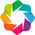

In [19]:
# Hint, this can be found in assignment 4
import community as louvain
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import hist

import bokeh
from bokeh.io import push_notebook, show, output_notebook, save
import bokeh.plotting as bp
from bokeh.plotting import figure, save, output_file, show #, from_networkx
from bokeh.models import (ColumnDataSource, LabelSet, Label, BoxSelectTool, Circle, EdgesAndLinkedNodes, HoverTool,MultiLine, NodesAndLinkedEdges, Plot, Range1d, TapTool,)
from holoviews.element.graphs import layout_nodes
# bokeh.sampledata.download()
from bokeh.sampledata.airport_routes import routes, airports

import community.community_louvain
from networkx.algorithms.community.centrality import girvan_newman

output_notebook()
from holoviews import dim, opts
hv.extension('bokeh', 'matplotlib')
from holoviews.operation import  gridmatrix
from holoviews import Graph, Nodes
from holoviews.plotting.bokeh import GraphPlot, LabelsPlot
import hvplot.networkx as hvnx
import hvplot.pandas

### The holoviews plot function

In [38]:
# Hint, this can be found in assignment 4
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

def _render(self, **kw):
  hv.extension('bokeh')
  return hv.Store.render(self)
hv.core.Dimensioned._repr_mimebundle_ = _render
        
def hvnx_plot(G,ctype,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
              title,bundled,nodelabels,xoffset,yoffset,
              arrowhead_length,selection_mode,selection_policy,
              edge_hover_line_color,node_hover_fill_color,
              fontsize,text_font_size, text_color,bgcolor):
    connections={}
    for n in G.nodes():
        t=list(G.neighbors(n))
        connections[n]=", ".join(sorted([x for x in t]))
    connected_components={}
    Gcc = sorted(connected_component_subgraphs(G), key = len, reverse=True)
    ccl=[list(g.nodes) for g in Gcc]
#     ccl=sorted(ccl, key=lambda item: len(item[1]), reverse=True)
    for i,j in enumerate(ccl):
        for n in j:
            connected_components[n]=i 
    if ctype==1:
        communities_generator = girvan_newman(G)
        top_level_communities = next(communities_generator)
        next_level_communities = next(communities_generator)
        lc=sorted(sorted(map(sorted, next_level_communities)), key=len,reverse=True)
        partition={n:i for i,c in enumerate(lc) for n in c }
        print("No. of connected components",len(ccl))
        print("No. of Girvan-Newman communities",len(set(partition.values())))
        for n in G.nodes():
            G.nodes[n]['Girvan-Newman_community'] = partition[n]
            if (n,n) in G.edges():
                G.nodes[n]['degree'] = 0
                G.nodes[n]['connections'] = ""
                G.nodes[n]['connected_component'] = connected_components[n]
            else:    
                G.nodes[n]['degree'] = G.degree(n)
                G.nodes[n]['connections'] = connections[n] #", ".join([str(x) for x in list(G.neighbors(n))])
                G.nodes[n]['connected_component'] = connected_components[n]
#         for n in G.nodes():
#             G.nodes[n]['Louvain_community'] = partition[n]
        graph = hvnx.draw(G, pos)
        graph.opts(edge_color=edge_color,edge_line_width=edge_line_width,node_size=node_size,node_color='Girvan-Newman_community',node_cmap=node_cmap)
        graph.opts(padding=0.15)
        if bundled==0:
            graph.opts(selection_policy=selection_policy,title=title,edge_hover_line_color=edge_hover_line_color,node_hover_fill_color=node_hover_fill_color,fontsize=fontsize,width=width,height=height,arrowhead_length=arrowhead_length) #,tools=tools) #,'box_zoom',"tap"])
            if nodelabels==1:
                labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                graph=(graph * labels.opts(xoffset=xoffset, yoffset=yoffset,text_font_size=text_font_size, text_color=text_color, bgcolor=bgcolor))            
                return graph
            else:
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                return graph
        else:
            graph = bundle_graph(graph)
            graph.opts(selection_policy=selection_policy,title=title,edge_hover_line_color=edge_hover_line_color,node_hover_fill_color=node_hover_fill_color,fontsize=fontsize,width=width,height=height,arrowhead_length=arrowhead_length) #,tools=tools) #,'box_zoom',"tap"])
            if nodelabels==1:
                labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                graph=(graph * labels.opts(xoffset=xoffset, yoffset=yoffset,text_font_size=text_font_size, text_color=text_color, bgcolor=bgcolor))
                return graph
            else:
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                return graph
    if ctype==0:
        partition_l=community.community_louvain.best_partition(G)
        print("No. of connected components",len(ccl))
        print("No. of Louvain communities",len(set(partition_l.values())))
        for n in G.nodes():
            G.nodes[n]['Louvain_community'] = partition_l[n]
            if (n,n) in G.edges():
                G.nodes[n]['degree'] = 0
                G.nodes[n]['connections'] = ""
    #             G.nodes[n]['connected_component'] = connected_components[n]
            else:    
                G.nodes[n]['degree'] = G.degree(n)
                G.nodes[n]['connections'] = connections[n] #", ".join([str(x) for x in list(G.neighbors(n))])  #connections          
    #             G.nodes[n]['connected_component'] = connected_components[n]
        graph = hvnx.draw(G, pos)
        graph.opts(edge_color=edge_color,edge_line_width=edge_line_width,node_size=node_size,node_color='Louvain_community',node_cmap=node_cmap)
        graph.opts(padding=0.15)
        if bundled==0:                
            graph.opts(selection_policy=selection_policy,title=title,edge_hover_line_color=edge_hover_line_color,node_hover_fill_color=node_hover_fill_color,fontsize=fontsize,width=width,height=height,arrowhead_length=arrowhead_length) #,tools=tools) #,'box_zoom',"tap"])
            if nodelabels==1:
                labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                graph=(graph * labels.opts(xoffset=xoffset, yoffset=yoffset,text_font_size=text_font_size, text_color=text_color, bgcolor=bgcolor))
                return graph
            else:
                hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                return graph
        else:
            graph = bundle_graph(graph)
            graph.opts(selection_policy=selection_policy,title=title,edge_hover_line_color=edge_hover_line_color,node_hover_fill_color=node_hover_fill_color,fontsize=fontsize,width=width,height=height,arrowhead_length=arrowhead_length) #,tools=tools) #,'box_zoom',"tap"])
            if nodelabels==1:
                labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                graph=(graph * labels.opts(xoffset=xoffset, yoffset=yoffset,text_font_size=text_font_size, text_color=text_color, bgcolor=bgcolor))
                return graph
            else:
                # hv.core.Dimensioned._repr_mimebundle_ = _render ## added
                return graph

### The holoviews plot of the citation graph. (Unbundled, nolabeled. Adjust parameters and title. Make sure that the size of nodes is such that the circles of nodes are not overlapping.)

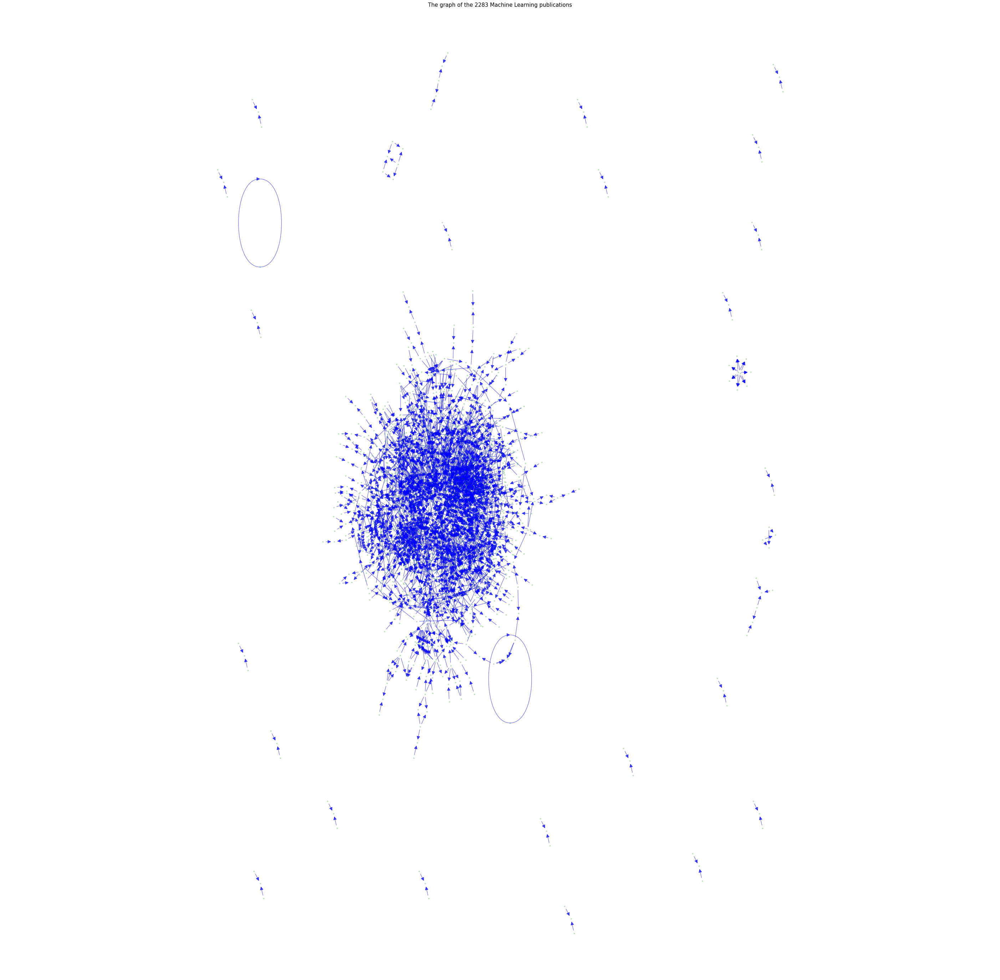

In [36]:
# Hint, this can be found in assignment 4, may require some modification
pos=graphviz_layout(G)

# pos=nx.spring_layout(G,1.)
# pos=nx.spectral_layout(G)

plt.figure(figsize=(50,50));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.2, node_size=10)
nx.draw_networkx_edges(G, pos,arrowsize=20, edge_color="b", alpha=0.7)
# nx.draw_networkx_labels(G, pos)
plt.axis('off');
ss="The graph of the %i Machine Learning publications" %(len(G.nodes()))
plt.title(ss,fontsize=15);
plt.margins(x=0.3, y=0) 

## 2. The Co-Citation Network

In [22]:
G1=G.copy()
medgesout=[]
n_out=[n for n in G1.nodes() if G1.out_degree(n)>1]
for n in n_out:
    nn=list(G1.successors(n))
    combs=combinations(nn, 2)
    for j in combs:
        medgesout.append((j[0],j[1]))
Gcocitation=nx.MultiGraph()
Gcocitation.add_edges_from(medgesout)
weight=[(x, y, {'weight': v}) for (x, y), v in Counter(Gcocitation.edges()).items()]
Gcocitation = nx.Graph(weight)
edge_width=[Gcocitation[u][v]['weight'] for u,v in Gcocitation.edges()]

st2="co-citation graph of the %s" %st
print("The %s has %i nodes and %i edges" %(st2,len(Gcocitation.nodes()),len(Gcocitation.edges())))

The co-citation graph of the Scopus bibliographic dataset on Machine Learning has 1154 nodes and 5872 edges


### The holoviews plot of the co-citation graph. (Bundled, nolabeled, Louvain communities. Adjust parameters and title. Make sure that the size of nodes is such that the circles of nodes are not overlapping.)

In [40]:
# Construction of the citation graph
G2 = nx.Graph()
for n in node_list: 
    G2.add_node(n)
G2.add_edges_from(edge_list)

# Remove nodes of degree 1
nodes_to_remove = []
for n in G2.nodes(): 
    if G2.degree(n) == 1: 
        nodes_to_remove.append(n)
G2.remove_nodes_from(nodes_to_remove)

# Remove nodes that are isolated 
nodes_to_remove = []
for n in G2.nodes(): 
    if G2.degree(n) == 0: 
        nodes_to_remove.append(n)
G2.remove_nodes_from(nodes_to_remove)

print("The citation graph of the %s has %i nodes and %i edges" %(st,len(G2.nodes()),len(G2.edges())))

The citation graph of the Scopus bibliographic dataset on Machine Learning has 2283 nodes and 3173 edges


No. of connected components 6
No. of Louvain communities 22


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
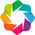

:Overlay
   .Graph.I  :Graph   [start,end]   (weight)
   .Labels.I :Labels   [x,y]   (index)

In [46]:
# Hint, this can be found in assignment 4, may require some modification
ctype=0
node_color='Louvain_community'

bundled=0
nodelabels=1

width=1000
height=1000
arrowhead_length=0.04
pos=graphviz_layout(Gcocitation)
node_size=5*np.log(5+hv.dim('degree')) #4*np.log(6+hv.dim('in-degree'))
node_cmap="tab10"
edge_color='olive'
edge_line_width=1
title="The pruned bipartite graph of actors vs. films (colored in Louvain communities)" 
selection_mode='nodes'
selection_policy="nodes"
edge_hover_line_color='green'
node_hover_fill_color='red'
fontsize={'title': '9pt'}
text_font_size='4pt'
text_color='black'
bgcolor='white'
xoffset=0
yoffset=-0.03 #-15
    
hvnx_plot(Gcocitation,ctype,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
             title,bundled,nodelabels,xoffset,yoffset,
             arrowhead_length,selection_mode,selection_policy,
             edge_hover_line_color,node_hover_fill_color,
             fontsize,text_font_size, text_color,bgcolor)

## 3. The Network of Bibliographic Coupling

In [48]:
G3=G.copy()
medgesin=[]
n_in=[n for n in G3.nodes() if G3.in_degree(n)>1]
for n in n_in:
    nn=list(G3.predecessors(n))
    combs=combinations(nn, 2)
    for j in combs:
        medgesin.append((j[0],j[1]))
Gbc=nx.MultiGraph() #create graph showing Bibliographic Coupling
Gbc.add_edges_from(medgesin)
weight=[(x, y, {'weight': v}) for (x, y), v in Counter(Gbc.edges()).items()]
Gbc = nx.Graph(weight)
edge_width=[Gbc[u][v]['weight'] for u,v in Gbc.edges()]

st4="graph of bibliographic coupling of the %s" %st
print("The %s has %i nodes and %i edges" %(st4,len(Gbc.nodes()),len(Gbc.edges())))

The graph of bibliographic coupling of the Scopus bibliographic dataset on Machine Learning has 1108 nodes and 5715 edges


### The holoviews plot of the bibliographic coupling graph. (Bundled, nolabeled, Girvan-Newman communities. Adjust parameters and title. Make sure that the size of nodes is such that the circles of nodes are not overlapping.)

No. of connected components 28
No. of Girvan-Newman communities 30


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
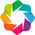

:Overlay
   .Graph.I  :Graph   [start,end]   (weight)
   .Labels.I :Labels   [x,y]   (index)

In [49]:
# Hint, this can be found in assignment 4, may require some modification
ctype=1
node_color="Girvan-Newman_community" #'Louvain_community'   "connected_component"

bundled=0
nodelabels=1

width=1000
height=1000
pos=graphviz_layout(Gbc)
node_size=2*np.log(5+hv.dim('degree')) #4*np.log(6+hv.dim('in-degree'))
node_cmap="tab10"
edge_color='lightgreen'
edge_line_width=1
title="The co-actorship (by films) pruned graph (colored in Girvan-Newman communities)" #connected components) Louvain communities
arrowhead_length=0.04
selection_mode='nodes'
selection_policy="nodes"
edge_hover_line_color='green'
node_hover_fill_color='red'
fontsize={'title': '9pt'}
text_font_size='4pt'
text_color='black'
bgcolor='white'
xoffset=0
yoffset=-3 #-15
    
hvnx_plot(Gbc,ctype,pos,width,height,node_size,node_cmap,edge_color,edge_line_width,
             title,bundled,nodelabels,xoffset,yoffset,
             arrowhead_length,selection_mode,selection_policy,
             edge_hover_line_color,node_hover_fill_color,
             fontsize,text_font_size, text_color,bgcolor)

Explore largest connected component - What does this say about your dataset? What are the differences between the graphs? What have you learned about the citation networks? Can you explain the differences between the different communities?